# Ptychography Tutorial 02

This is the second tutorial notebook in the iterative ptychography series.  
In this tutorial notebook we will cover:
- The origin of the pathological gridding artifact
- Various reconstruction and experimental parameter remedies

### Downloads
This tutorial uses the following datasets:
- [ptycho_ducky_simulation_01.h5](https://drive.google.com/file/d/1VtYVHWiuI8AT0yucaylIcQQJ_px79ash/view?usp=drive_link)
- [ptycho_ducky_vacuum-probe_01.h5](https://drive.google.com/file/d/1CeVGVvMf2QeJK1ADQ9MBK308NhvoVaVn/view?usp=drive_link)
- [ptycho_ducky_simulation_02.h5](https://drive.google.com/file/d/1frkwD0vuxWGkiKfF_Crws3uI-JUn9I5C/view?usp=drive_link)
- [ptycho_ducky_vacuum-probe_02.h5](https://drive.google.com/file/d/11chKt0jZKnqM65STlYhwz5g7Z5es1f4r/view?usp=drive_link)
- [ptycho_ducky_simulation_03.h5](https://drive.google.com/file/d/1rCWIokqDGINpex_zYz4ryiiEkfuh1xTI/view?usp=drive_link)
- [ptycho_ducky_vacuum-probe_03.h5](https://drive.google.com/file/d/1aiZbsXU1dUf4RIHZDLUbWsGZlZZAaClM/view?usp=drive_link)

### Acknowledgements

This tutorial was created by the py4DSTEM `phase_contrast` team:
- Georgios Varnavides (gvarnavides@berkeley.edu)
- Stephanie Ribet (sribet@lbl.gov)
- Colin Ophus (clophus@lbl.gov)

Last updated 2024 May 6

## Pathological Gridding Artifact

In the previous tutorial, we saw a pronnounced gridding artifact in our single-slice reconstruction of ducky.  
Let's quickly reproduce that by importing the dataset and running a few ptychographic iterations.

In [1]:
import numpy as np
import py4DSTEM
import matplotlib.pyplot as plt

print(py4DSTEM.__version__)

0.14.14


In [2]:
file_path = 'data/'
file_data_01 = file_path + 'ptycho_ducky_simulation_01.h5'
file_probe_01 = file_path + 'ptycho_ducky_vacuum-probe_01.h5'

dataset_01 = py4DSTEM.read(file_data_01)
probe_01 = py4DSTEM.read(file_probe_01)
dataset_01.calibration

Calibration( A Metadata instance called 'calibration', containing the following fields:

             Q_pixel_size:     0.025
             R_pixel_size:     5.0
             Q_pixel_units:    A^-1
             R_pixel_units:    A
             QR_flip:          False
             _root_treepath:   
)

Best fit rotation = -15 degrees.
Normalizing amplitudes: 100%|███████████████████████████████████████████████████████████████| 1089/1089 [00:00<00:00, 4090.64probe position/s]
Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5, in batches of max 512 measurements.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:09<00:00,  6.52 iter/s]


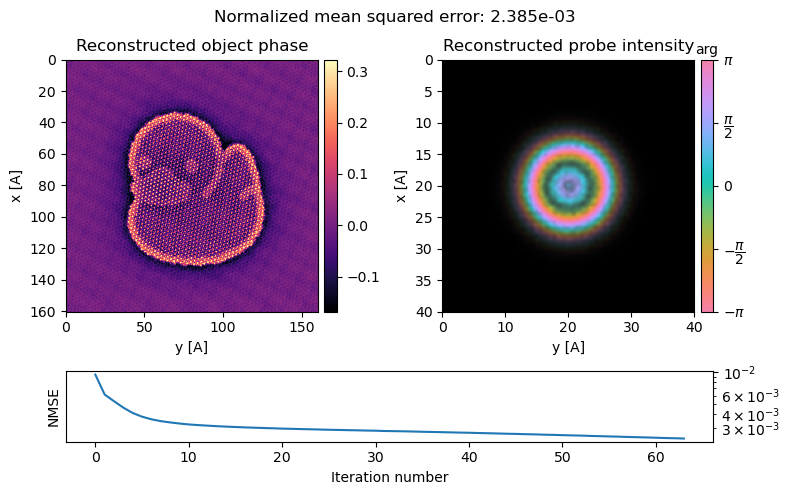

In [3]:
ptycho_01 = py4DSTEM.process.phase.SingleslicePtychography(
    datacube=dataset_01,
    energy=80e3,
    defocus=500,
    vacuum_probe_intensity=probe_01.data,
    device='gpu', # uncomment if you have access to a GPU
    storage='cpu', # uncomment if you have access to a GPU
).preprocess(
    plot_center_of_mass = False,
    plot_rotation=False,
    plot_probe_overlaps=False,
).reconstruct(
    num_iter = 64,
    seed_random=0,
    max_batch_size=512,
).visualize(
)

ptycho_01_object = np.angle(ptycho_01.object_cropped).copy()
ptycho_01_object_fft = ptycho_01.object_fft

First, note that the artifact is only pathological in "blind" ptychgography - i.e. when we have to simultaneously solve for the object and the probe. If we have a good guess for the probe we can use `fix_probe` to eliminate this.

Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5, in batches of max 512 measurements.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:09<00:00,  6.72 iter/s]


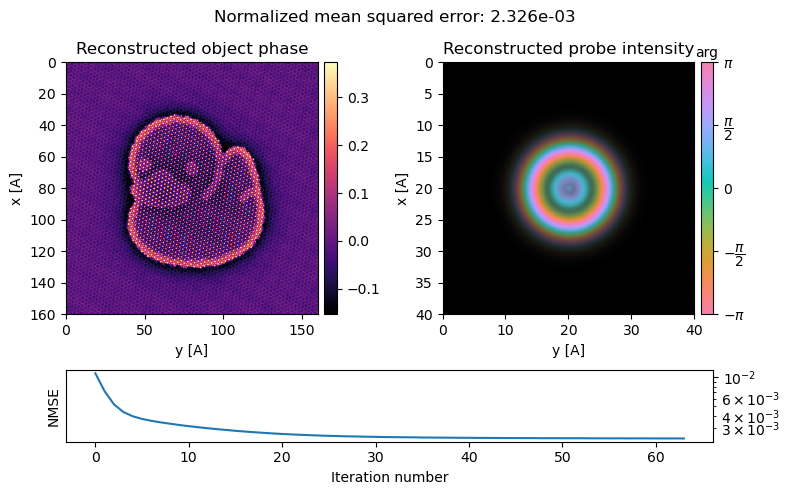

In [4]:
ptycho_01 = ptycho_01.reconstruct(
    reset=True,
    num_iter = 64,
    seed_random=0,
    max_batch_size=512,
    fix_probe=True,
).visualize(
)

ptycho_01_object_fixed = np.angle(ptycho_01.object_cropped).copy()
ptycho_01_object_fft_fixed = ptycho_01.object_fft

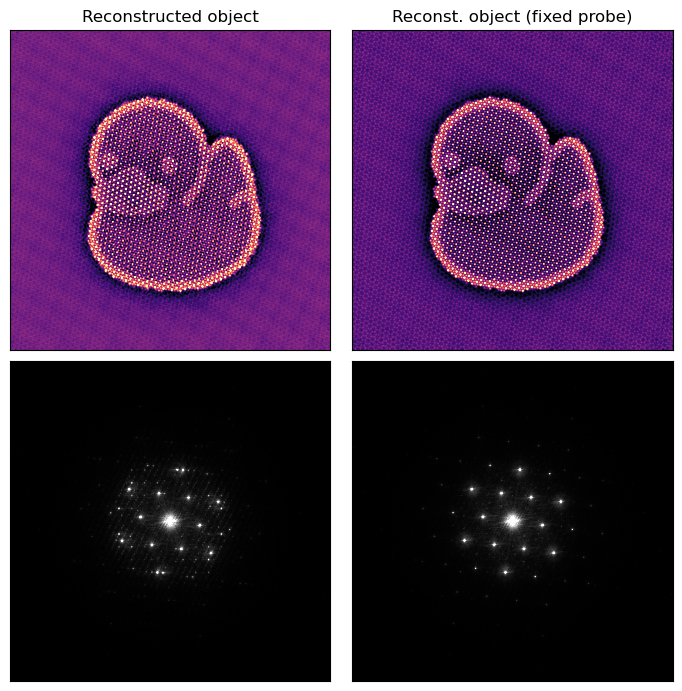

In [5]:
fig, axs = plt.subplots(2,2,figsize=(3.5*2,3.5*2))

py4DSTEM.show(
    [
        ptycho_01_object,
        ptycho_01_object_fixed
    ],
    ticks=False,
    figax=(fig,axs[0]),
    cmap='magma',
    title=[
        "Reconstructed object","Reconst. object (fixed probe)",
    ],
)

py4DSTEM.show(
    [
        ptycho_01_object_fft,
        ptycho_01_object_fft_fixed
    ],
    ticks=False,
    figax=(fig,axs[1]),
    vmin=0.001,
    vmax=0.999,
)

fig.tight_layout()

### Vacuum Probe Measurements

This is why we recommend collecting a vacuum probe measurement before/after the experiment, to constrain the probe and thus remove some of these artifacts.

However, it's important to realize even slight misalignments of the probe aperture with the measured diffraction patterns can result in very aggressive gridding. For example below we initialize with the correct semiangle (20 mrad), but using a different edge "softness".

Best fit rotation = -15 degrees.
Normalizing amplitudes: 100%|███████████████████████████████████████████████████████████████| 1089/1089 [00:00<00:00, 3771.01probe position/s]
Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5, in batches of max 512 measurements.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:09<00:00,  6.71 iter/s]


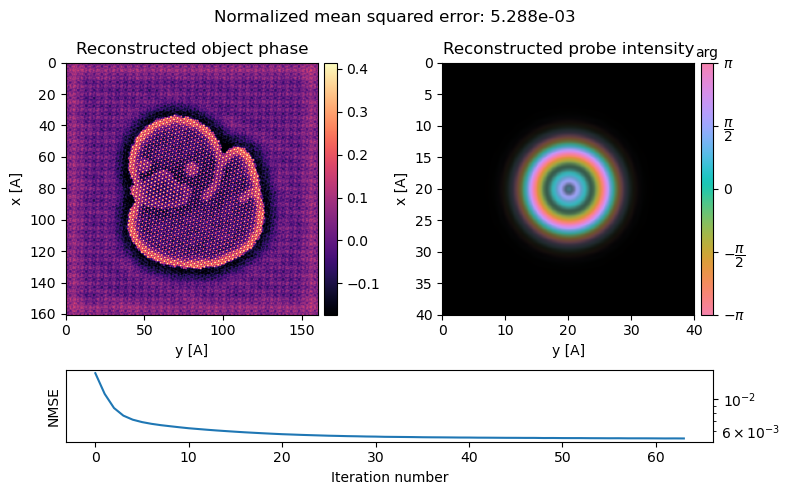

In [6]:
ptycho_01_misaligned = py4DSTEM.process.phase.SingleslicePtychography(
    datacube=dataset_01,
    energy=80e3,
    defocus=500,
    semiangle_cutoff=20, # perfect semicircular aperture
    device='gpu', # uncomment if you have access to a GPU
    storage='cpu', # uncomment if you have access to a GPU
).preprocess(
    plot_center_of_mass = False,
    plot_rotation=False,
    plot_probe_overlaps=False,
).reconstruct(
    num_iter = 64,
    seed_random=0,
    max_batch_size=512,
    fix_probe=True,
).visualize(
)

ptycho_01_misaligned_object = np.angle(ptycho_01_misaligned.object_cropped).copy()
ptycho_01_misaligned_object_fft = ptycho_01_misaligned.object_fft

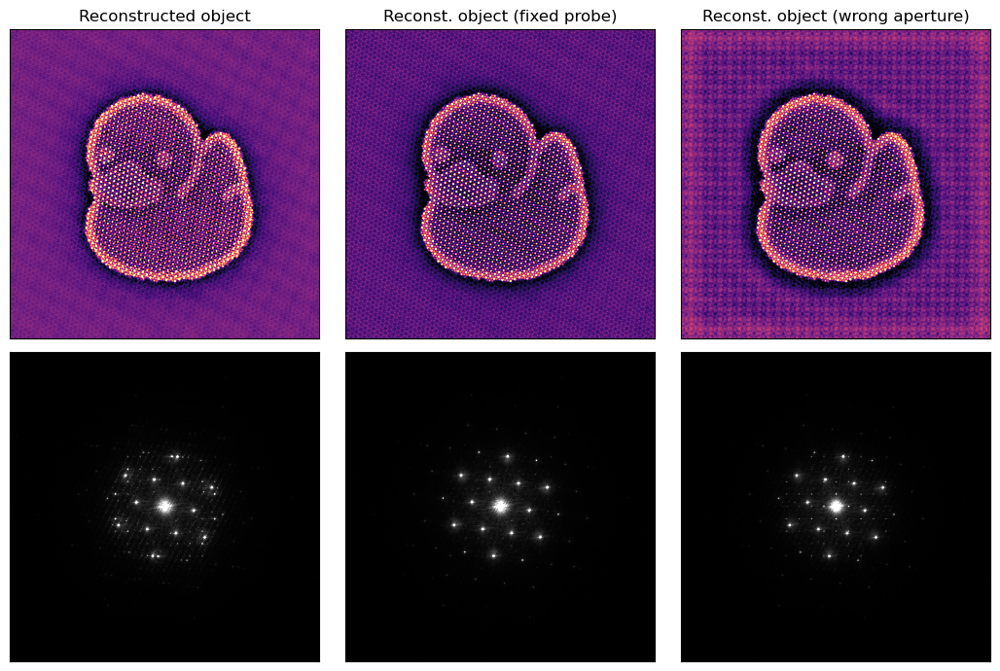

In [7]:
fig, axs = plt.subplots(2,3,figsize=(3.5*3,3.5*2))

py4DSTEM.show(
    [
        ptycho_01_object,
        ptycho_01_object_fixed,
        ptycho_01_misaligned_object,
    ],
    ticks=False,
    figax=(fig,axs[0]),
    cmap='magma',
    title=[
        "Reconstructed object","Reconst. object (fixed probe)",
        "Reconst. object (wrong aperture)"
    ],
)

py4DSTEM.show(
    [
        ptycho_01_object_fft,
        ptycho_01_object_fft_fixed,
        ptycho_01_misaligned_object_fft,
    ],
    ticks=False,
    figax=(fig,axs[1]),
    vmin=0.001,
    vmax=0.999,
)

fig.tight_layout()

### Small Batch Sizes

While it's often useful to initialize the probe with a vacuum probe measurement - we often seek alternative ways of circumventing gridding.  
A simple thing to try is to lower the batch-size and allow the algorithm to recover by more frequent probe update steps:

Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5, in batches of max 8 measurements.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:45<00:00,  1.41 iter/s]


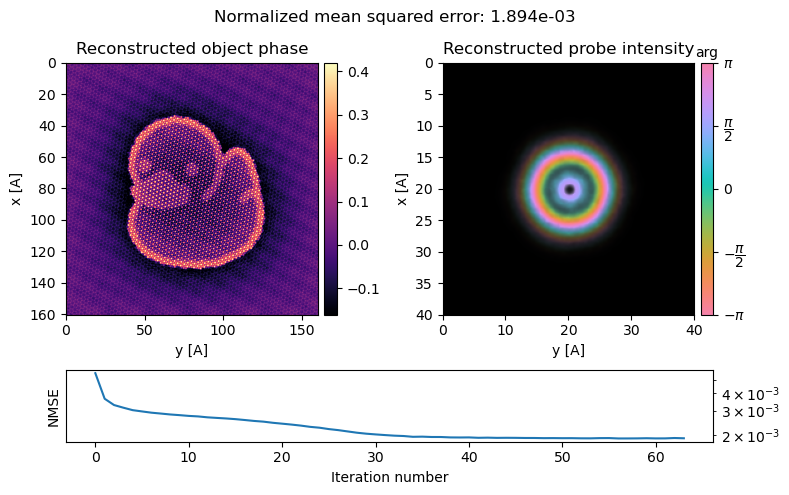

In [8]:
ptycho_01_misaligned = ptycho_01_misaligned.reconstruct(
    reset=True,
    num_iter = 64,
    seed_random=0,
    max_batch_size=8,
).visualize(
)

ptycho_01_misaligned_object_batch = np.angle(ptycho_01_misaligned.object_cropped).copy()
ptycho_01_misaligned_object_fft_batch = ptycho_01_misaligned.object_fft

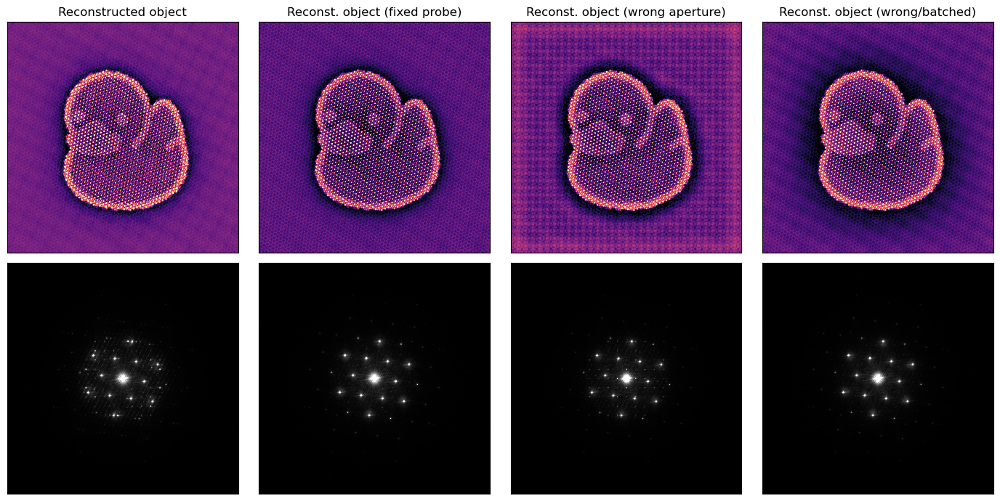

In [9]:
fig, axs = plt.subplots(2,4,figsize=(3.5*4,3.5*2))

py4DSTEM.show(
    [
        ptycho_01_object,
        ptycho_01_object_fixed,
        ptycho_01_misaligned_object,
        ptycho_01_misaligned_object_batch
    ],
    ticks=False,
    figax=(fig,axs[0]),
    cmap='magma',
    title=[
        "Reconstructed object","Reconst. object (fixed probe)",
        "Reconst. object (wrong aperture)","Reconst. object (wrong/batched)",
    ],
)

py4DSTEM.show(
    [
        ptycho_01_object_fft,
        ptycho_01_object_fft_fixed,
        ptycho_01_misaligned_object_fft,
        ptycho_01_misaligned_object_fft_batch
    ],
    ticks=False,
    figax=(fig,axs[1]),
    vmin=0.001,
    vmax=0.999,
)

fig.tight_layout()

### Increased Real-Space Overlap (Defocus)

Ultimately however, this reflects a pathology in the collected data which we can try and improve by additional redundancy, e.g. by increasing the real-space overlap between neighboring probes.

One way to do this is by increasing the defocus (thus making the extent of our probe larger).  
Here, we import another simulation with 600 A of defocus, and otherwise identical parameters.

In [10]:
file_data_02 = file_path + 'ptycho_ducky_simulation_02.h5'
file_probe_02 = file_path + 'ptycho_ducky_vacuum-probe_02.h5'

dataset_02 = py4DSTEM.read(file_data_02)
probe_02 = py4DSTEM.read(file_probe_02)
dataset_02.calibration

Calibration( A Metadata instance called 'calibration', containing the following fields:

             Q_pixel_size:     0.025
             R_pixel_size:     5.0
             Q_pixel_units:    A^-1
             R_pixel_units:    A
             QR_flip:          False
             _root_treepath:   
)

Best fit rotation = -15 degrees.
Normalizing amplitudes: 100%|███████████████████████████████████████████████████████████████| 1089/1089 [00:00<00:00, 3860.52probe position/s]
Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5, in batches of max 512 measurements.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:09<00:00,  6.53 iter/s]


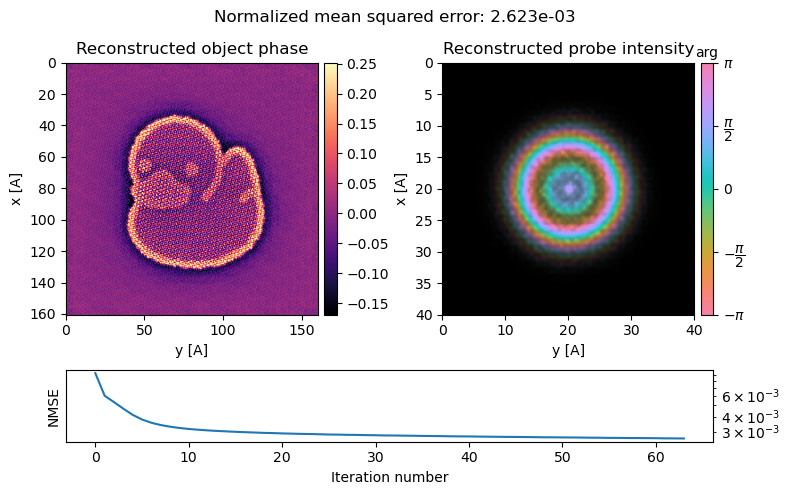

In [11]:
ptycho_02 = py4DSTEM.process.phase.SingleslicePtychography(
    datacube=dataset_02,
    energy=80e3,
    defocus=600, # 600 A instead of 500 A
    vacuum_probe_intensity=probe_02.data,
    device='gpu', # uncomment if you have access to a GPU
    storage='cpu', # uncomment if you have access to a GPU
).preprocess(
    plot_center_of_mass = False,
    plot_rotation=False,
    plot_probe_overlaps=False,
).reconstruct(
    num_iter = 64,
    seed_random=0,
    max_batch_size=512,
).visualize(
)

ptycho_02_object = np.angle(ptycho_02.object_cropped).copy()
ptycho_02_object_fft = ptycho_02.object_fft

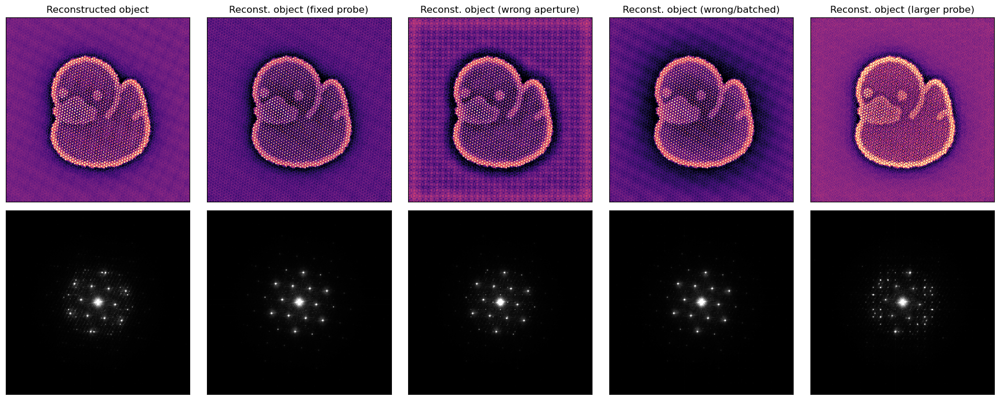

In [12]:
fig, axs = plt.subplots(2,5,figsize=(3.5*5,3.5*2))

py4DSTEM.show(
    [
        ptycho_01_object,
        ptycho_01_object_fixed,
        ptycho_01_misaligned_object,
        ptycho_01_misaligned_object_batch,
        ptycho_02_object
    ],
    ticks=False,
    figax=(fig,axs[0]),
    cmap='magma',
    title=[
        "Reconstructed object","Reconst. object (fixed probe)",
        "Reconst. object (wrong aperture)","Reconst. object (wrong/batched)",
        "Reconst. object (larger probe)",
    ],
)

py4DSTEM.show(
    [
        ptycho_01_object_fft,
        ptycho_01_object_fft_fixed,
        ptycho_01_misaligned_object_fft,
        ptycho_01_misaligned_object_fft_batch,
        ptycho_02_object_fft
    ],
    ticks=False,
    figax=(fig,axs[1]),
    vmin=0.001,
    vmax=0.999,
)

fig.tight_layout()

Uh-oh, the gridding is even more pronnounced now! What went wrong?  
The region-of-interest cropping box is too small to fit our very defocused probe, so we get self-interaction artifacts from the probe!

Let's investigate this by comparing the initialized probes:

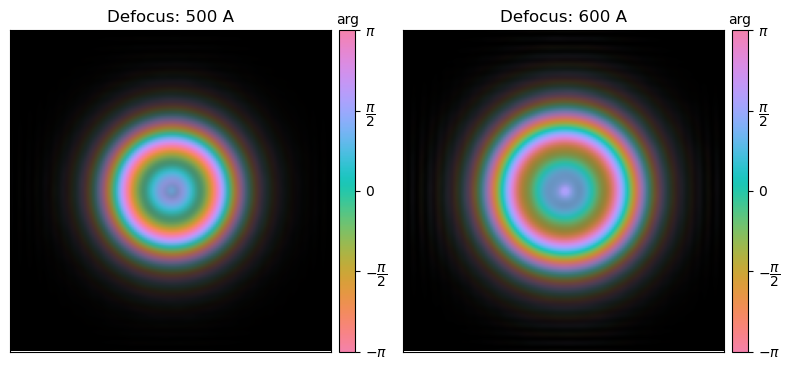

In [13]:
asnumpy = ptycho_01._asnumpy
py4DSTEM.show_complex(
    [
        asnumpy(ptycho_01._return_centered_probe(ptycho_01._probe_initial)),
        asnumpy(ptycho_02._return_centered_probe(ptycho_02._probe_initial))
    ],
    ticks=False,
    axsize=(4,4),
    title=["Defocus: 500 A","Defocus: 600 A"],
)

If you squint, you can see the self-interaction in the larger probe at the cropping box edges on the right (which appears to have square symmetry at the boundaries)!  
To get a more quantitative view, let's plot the \% intensity in our probe tails beyond the cropping box extent as a function of defocus:

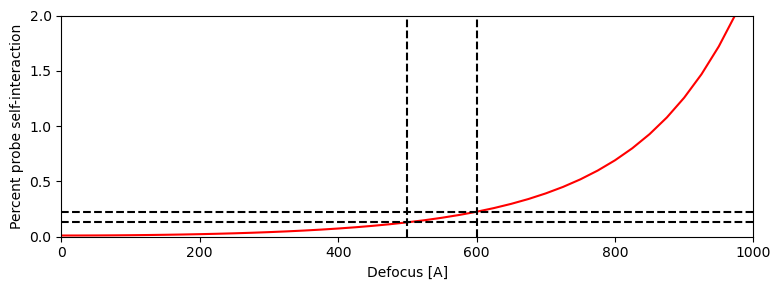

In [14]:
def lost_probe_tails(gpts,**kwargs):

    probe = py4DSTEM.process.phase.utils.ComplexProbe(
        gpts=(gpts[0]*2,gpts[1]*2),
        **kwargs,
    ).build()._array

    probe_intensity = np.abs(np.fft.fftshift(probe))**2
    probe_intensity_inside = 1-np.sum(probe_intensity[gpts[0]//2:-gpts[0]//2,gpts[1]//2:-gpts[1]//2])

    return probe_intensity_inside*100

kwargs = {"energy":80e3,"gpts":(200,200),"sampling":(0.2,0.2),"semiangle_cutoff":20}
defoci = np.arange(0,1000,25)
self_interaction = [lost_probe_tails(defocus=df,**kwargs) for df in defoci]

fig,ax = plt.subplots(figsize=(8,3))
ax.plot(defoci,self_interaction,color='red')
ax.set_xlabel("Defocus [A]")
ax.set_ylabel("Percent probe self-interaction")
ax.vlines([500,600],ymin=0,ymax=2,linestyle="dashed",colors="k")
ax.hlines([self_interaction[20],self_interaction[24]],xmin=0,xmax=1000,linestyle="dashed",colors="k")
ax.set_xlim([0,1000])
ax.set_ylim([0,2])
fig.tight_layout()

In [15]:
print(f"Probe self-interaction:\n    500 A defocus: {self_interaction[20]:.3f}%\n    600 A defocus: {self_interaction[24]:.3f}%")

Probe self-interaction:
    500 A defocus: 0.130%
    600 A defocus: 0.226%


As insignificant as this 0.1% difference in probe self-interaction might seem, it can lead to gridding!

### Increased Real-Space Overlap (Sampling)

An alternative way to increase our real-space overlap, without increasing defocus, is to simply use a finer sampling. Here, we import another simulation with 4A step-size (instead of 5A), and otherwise identical parameters.

In [16]:
file_data_03 = file_path + 'ptycho_ducky_simulation_03.h5'
file_probe_03 = file_path + 'ptycho_ducky_vacuum-probe_03.h5'

dataset_03 = py4DSTEM.read(file_data_03)
probe_03 = py4DSTEM.read(file_probe_03)
dataset_03.calibration

Calibration( A Metadata instance called 'calibration', containing the following fields:

             Q_pixel_size:     0.025
             R_pixel_size:     4.0
             Q_pixel_units:    A^-1
             R_pixel_units:    A
             QR_flip:          False
             _root_treepath:   
)

Best fit rotation = -15 degrees.
Normalizing amplitudes: 100%|███████████████████████████████████████████████████████████████| 1681/1681 [00:00<00:00, 4018.59probe position/s]
Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5, in batches of max 512 measurements.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:14<00:00,  4.31 iter/s]


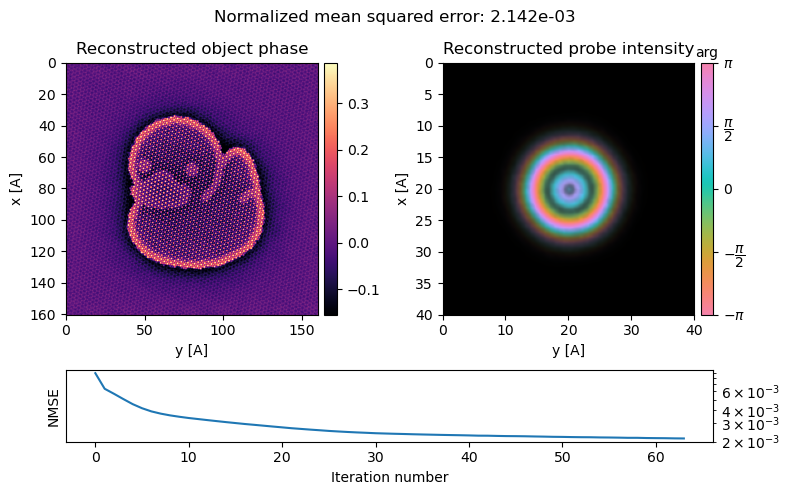

In [17]:
ptycho_03 = py4DSTEM.process.phase.SingleslicePtychography(
    datacube=dataset_03,
    energy=80e3,
    defocus=500, 
    vacuum_probe_intensity=probe_03.data,
    device='gpu', # uncomment if you have access to a GPU
    storage='cpu', # uncomment if you have access to a GPU
).preprocess(
    plot_center_of_mass = False,
    plot_rotation=False,
    plot_probe_overlaps=False,
).reconstruct(
    num_iter = 64,
    seed_random=0,
    max_batch_size=512,
).visualize(
)

ptycho_03_object = np.angle(ptycho_03.object_cropped).copy()
ptycho_03_object_fft = ptycho_03.object_fft

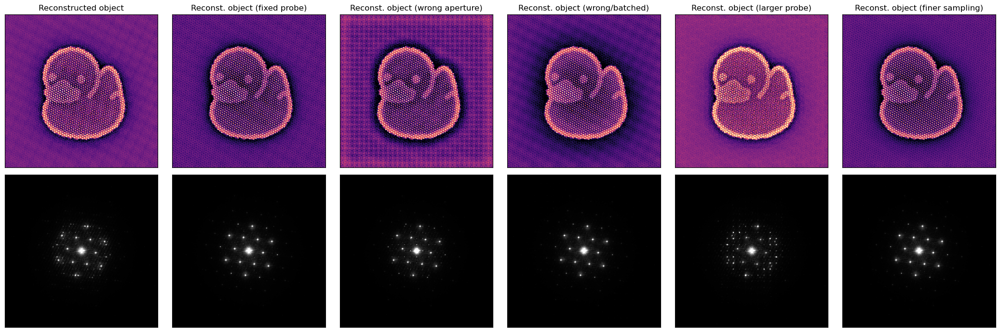

In [18]:
fig, axs = plt.subplots(2,6,figsize=(3.5*6,3.5*2))

py4DSTEM.show(
    [
        ptycho_01_object,
        ptycho_01_object_fixed,
        ptycho_01_misaligned_object,
        ptycho_01_misaligned_object_batch,
        ptycho_02_object,
        ptycho_03_object,
    ],
    ticks=False,
    figax=(fig,axs[0]),
    cmap='magma',
    title=[
        "Reconstructed object","Reconst. object (fixed probe)",
        "Reconst. object (wrong aperture)","Reconst. object (wrong/batched)",
        "Reconst. object (larger probe)", "Reconst. object (finer sampling)"
    ],
)

py4DSTEM.show(
    [
        ptycho_01_object_fft,
        ptycho_01_object_fft_fixed,
        ptycho_01_misaligned_object_fft,
        ptycho_01_misaligned_object_fft_batch,
        ptycho_02_object_fft,
        ptycho_03_object_fft
    ],
    ticks=False,
    figax=(fig,axs[1]),
    vmin=0.001,
    vmax=0.999,
)

fig.tight_layout()

### Mixed-State Ptychography

Finally, we can (ab)use the mixed-state formalism to absorb a lot of the gridding artifacts.  
Note that while we usually try and use a small batch-size to update the probe frequently in mixed-state ptychography, here we deliberately omit the `max_batch_size` option (i.e. use all the probes at once) to absorb the gridding artifact into a "sacrificial" probe.

Best fit rotation = -15 degrees.
Normalizing amplitudes: 100%|███████████████████████████████████████████████████████████████| 1089/1089 [00:00<00:00, 3933.83probe position/s]
Performing 64 iterations using a complex object type, with the gradient-descent algorithm, with normalization_min: 1 and step _size: 0.5.
Reconstructing object and probe: 100%|█████████████████████████████████████████████████████████████████████| 64/64 [00:14<00:00,  4.33 iter/s]


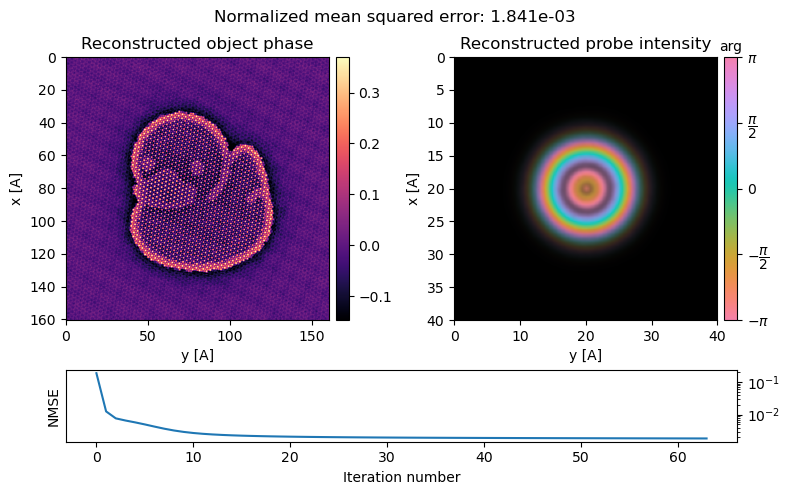

In [19]:
ptycho_01_mixed = py4DSTEM.process.phase.MixedstatePtychography(
    datacube=dataset_01,
    energy=80e3,
    defocus=500,
    vacuum_probe_intensity= probe_01.data,
    num_probes=2,
    device='gpu', # uncomment if you have access to a GPU
    storage='cpu', # uncomment if you have access to a GPU
).preprocess(
    plot_center_of_mass = False,
    plot_rotation=False,
    plot_probe_overlaps=False,
).reconstruct(
    num_iter = 64,
    seed_random=2024,
).visualize(
)

ptycho_01_mixed_object = np.angle(ptycho_01_mixed.object_cropped).copy()
ptycho_01_mixed_object_fft = ptycho_01_mixed.object_fft

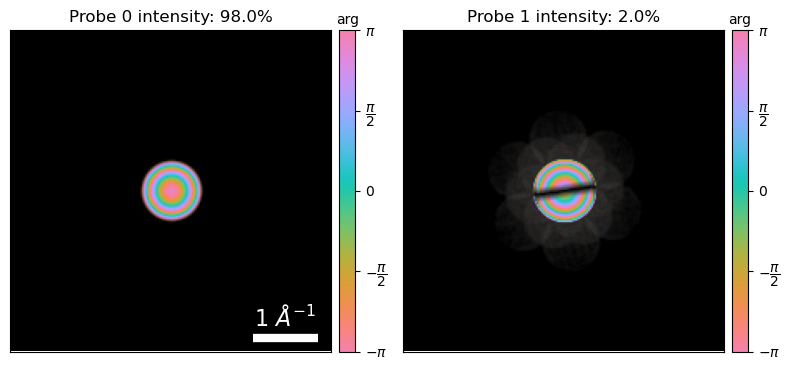

In [20]:
ptycho_01_mixed.show_fourier_probe()

Notice that our first probe "mode" is still doing all the heavy-lifting, with >95% of the intensity. The second probe "mode" is simply used to absorb the measurement noise and gridding artifacts.  
As an added benefit it also absorbs the persky mean-diffraction pattern artifact we saw in the previous tutorial!

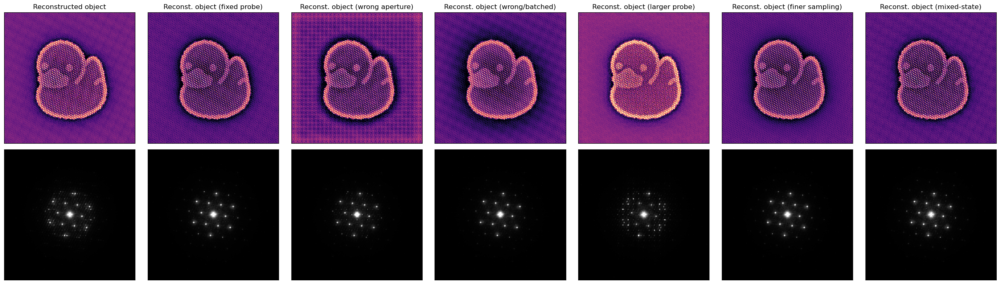

In [21]:
fig, axs = plt.subplots(2,7,figsize=(3.5*7,3.5*2))

py4DSTEM.show(
    [
        ptycho_01_object,
        ptycho_01_object_fixed,
        ptycho_01_misaligned_object,
        ptycho_01_misaligned_object_batch,
        ptycho_02_object,
        ptycho_03_object,
        ptycho_01_mixed_object,
    ],
    ticks=False,
    figax=(fig,axs[0]),
    cmap='magma',
    title=[
        "Reconstructed object","Reconst. object (fixed probe)",
        "Reconst. object (wrong aperture)","Reconst. object (wrong/batched)",
        "Reconst. object (larger probe)", "Reconst. object (finer sampling)","Reconst. object (mixed-state)"
    ],
)

py4DSTEM.show(
    [
        ptycho_01_object_fft,
        ptycho_01_object_fft_fixed,
        ptycho_01_misaligned_object_fft,
        ptycho_01_misaligned_object_fft_batch,
        ptycho_02_object_fft,
        ptycho_03_object_fft,
        ptycho_01_mixed_object_fft,
    ],
    ticks=False,
    figax=(fig,axs[1]),
    vmin=0.001,
    vmax=0.999,
)

fig.tight_layout()